In [1]:
import sys
import numpy as np
from astropy.io import fits
from aspired import image_reduction
from aspired import spectral_reduction
import plotly.io as pio
pio.renderers.default = 'notebook_connected'

/usr/local/lib/python3.7/site-packages/tqdm/autonotebook/__init__.py:18: TqdmExperimentalWarning:

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)



/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:292: UserWarning:

saxis keyword "SAXIS" is not in the header. saxis is set to 1.

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:534: UserWarning:

No dark frames. Dark subtraction is not performed.

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:733: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:733: RuntimeWarning:

invalid value encountered in log10



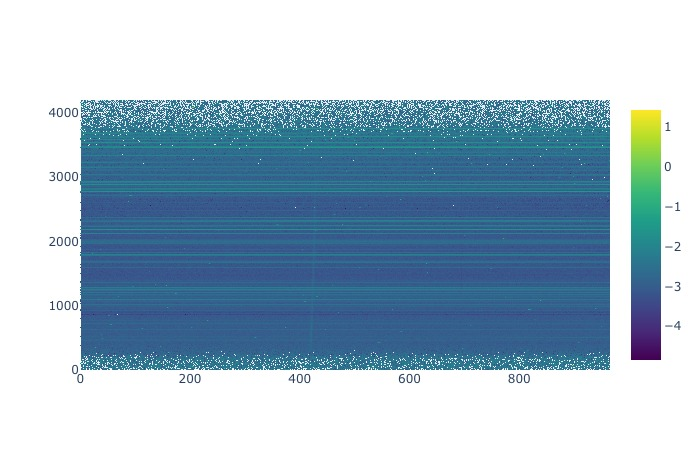

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:292: UserWarning:

saxis keyword "SAXIS" is not in the header. saxis is set to 1.

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:534: UserWarning:

No dark frames. Dark subtraction is not performed.

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:733: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/image_reduction.py:733: RuntimeWarning:

invalid value encountered in log10



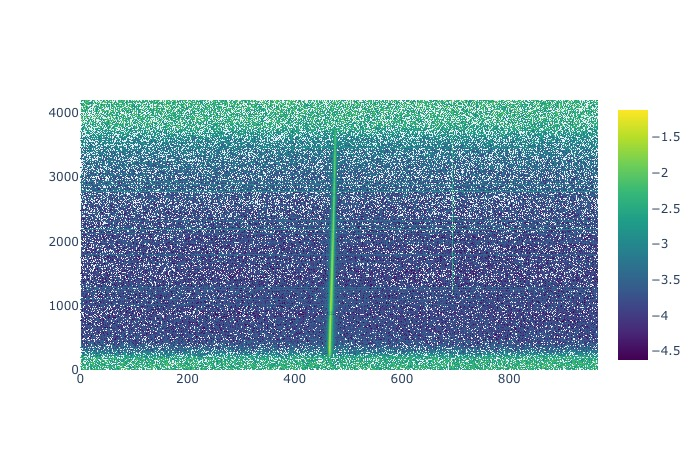

In [2]:
science_frame = image_reduction.ImageReduction('examples/isis_pso1801p6254.list')
science_frame.reduce()
science_frame.inspect(renderer='jpg')
#science_frame.savefits(overwrite=True)

standard_frame = image_reduction.ImageReduction('examples/isis_g93m48.list')
standard_frame.reduce()
standard_frame.inspect(renderer='jpg')

In [3]:
# Set the spectral and spatial direction
Saxis = 0

# spec mask
spec_mask = np.arange(100, 4000)
spatial_mask = np.arange(300, 550)

# initialise the two spectral_reduction.TwoDSpec()
pso = spectral_reduction.TwoDSpec(
    science_frame,
    spatial_mask=spatial_mask,
    spec_mask=spec_mask,
    saxis=Saxis,
    readnoise=4.5,
    cosmicray=False,
    gain=0.98,
    seeing=1.1,
    silence=True
)
g93 = spectral_reduction.TwoDSpec(
    standard_frame,
    spatial_mask=spatial_mask,
    spec_mask=spec_mask,
    saxis=Saxis,
    readnoise=4.5,
    cosmicray=False,
    gain=0.98,
    seeing=1.1,
    silence=True
)

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:347: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:347: RuntimeWarning:

invalid value encountered in log10



/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:912: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:912: RuntimeWarning:

invalid value encountered in log10



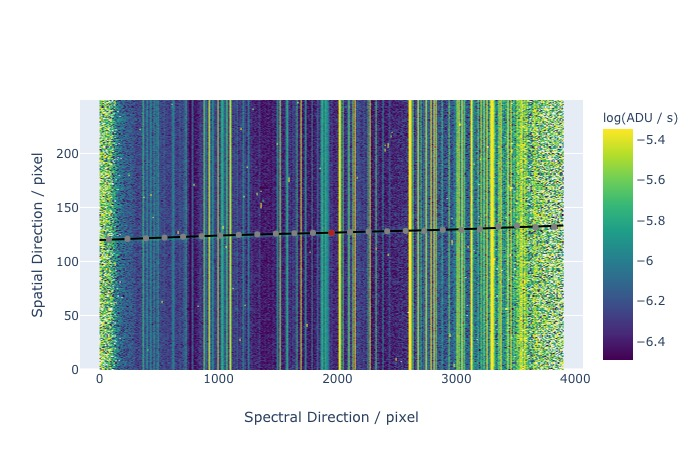

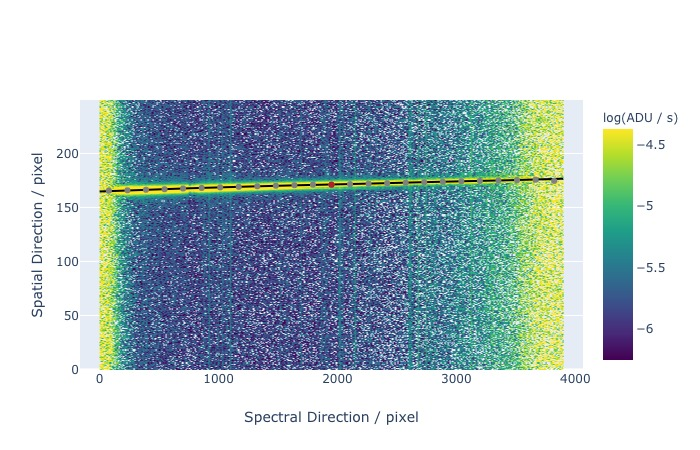

In [4]:
# automatically trace the spectrum
pso.ap_trace(renderer='jpg', display=True)
g93.ap_trace(renderer='jpg', display=True)

In [5]:
# Optimal extracting spectrum by summing over the aperture along the trace
pso.ap_extract(
    apwidth=15,
    optimal=True,
    display=True)
g93.ap_extract(
    apwidth=20, skysep=3, skywidth=5, skydeg=1,
    optimal=True,
    display=True)

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:625: RuntimeWarning:

invalid value encountered in double_scalars

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:612: RuntimeWarning:

divide by zero encountered in true_divide

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:1189: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:1189: RuntimeWarning:

invalid value encountered in log10

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:1317: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:1325: RuntimeWarning:

invalid value encountered in log10

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:1328: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:1329: RuntimeWarning:

invalid value encountered in log10



/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:1189: RuntimeWarning:

divide by zero encountered in log10

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:1189: RuntimeWarning:

invalid value encountered in log10

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:1325: RuntimeWarning:

invalid value encountered in log10

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:1329: RuntimeWarning:

invalid value encountered in log10



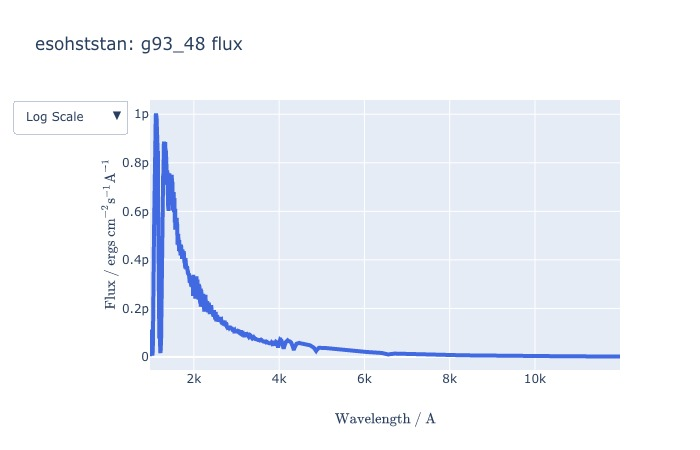

In [6]:
fluxcal = spectral_reduction.StandardFlux(silence=False)
fluxcal.load_standard(
    target='g93_48',
    library='esohststan',
    cutoff=0.4,
    ftype='flux',
    display=False
)
fluxcal.inspect_standard(renderer='jpg')

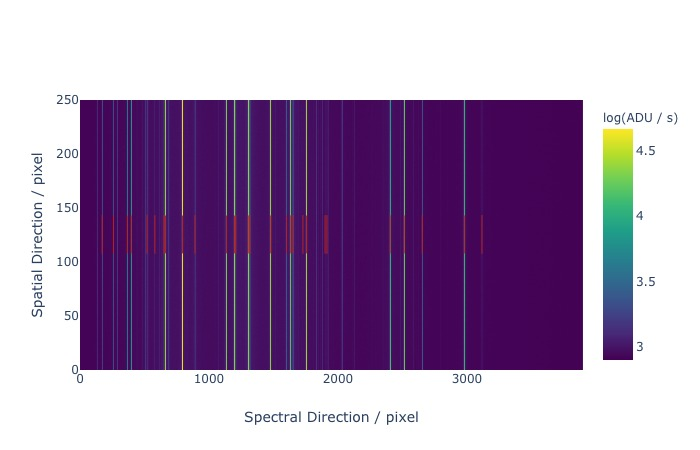

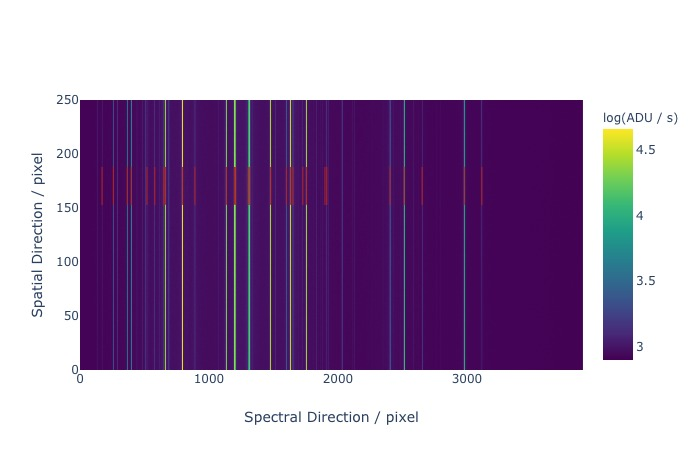

In [7]:
# Placeholder of wavelength calibration
wavecal_science = spectral_reduction.WavelengthPolyFit(pso, science_frame)
wavecal_standard = spectral_reduction.WavelengthPolyFit(g93, standard_frame)

wavecal_science.find_arc_lines(display=True, renderer='jpg', percentile=20.)
wavecal_standard.find_arc_lines(display=True, renderer='jpg', percentile=20.)

In [8]:
wavecal_science.fit(
    elements=["CuNeAr_low"],
    sample_size=5,
    min_wave=7000.,
    max_wave=10500.,
    range_tolerance=500,
    ransac_thresh=1,
    polydeg=5,
    display=True)
wavecal_standard.fit(
    elements=["CuNeAr_low"],
    sample_size=5,
    min_wave=7000.,
    max_wave=10500.,
    range_tolerance=500,
    ransac_thresh=1,
    polydeg=5,
    display=True)

INFO:rascal.calibrator:Peak at: 7067.30774596161 A
INFO:rascal.calibrator:- matched to 7067.218 A
INFO:rascal.calibrator:Peak at: 7146.95901860631 A
INFO:rascal.calibrator:- matched to 7147.042 A
INFO:rascal.calibrator:Peak at: 7245.131938028622 A
INFO:rascal.calibrator:- matched to 7245.167 A
INFO:rascal.calibrator:Peak at: 7272.858542265983 A
INFO:rascal.calibrator:- matched to 7272.936 A
INFO:rascal.calibrator:Peak at: 7383.919047371837 A
INFO:rascal.calibrator:- matched to 7383.981 A
INFO:rascal.calibrator:Peak at: 7439.081495303816 A
INFO:rascal.calibrator:- matched to 7438.899 A
INFO:rascal.calibrator:Peak at: 7503.911923505382 A
INFO:rascal.calibrator:- matched to 7503.869 A
INFO:rascal.calibrator:Peak at: 7514.650228813636 A
INFO:rascal.calibrator:- matched to 7514.652 A
INFO:rascal.calibrator:Peak at: 7635.080145615448 A
INFO:rascal.calibrator:- matched to 7635.106 A
INFO:rascal.calibrator:Peak at: 7723.983121848618 A
INFO:rascal.calibrator:- matched to 7723.98 A
INFO:rascal.c

INFO:rascal.calibrator:Peak at: 7067.2778855945 A
INFO:rascal.calibrator:- matched to 7067.218 A
INFO:rascal.calibrator:Peak at: 7146.9879447700305 A
INFO:rascal.calibrator:- matched to 7147.042 A
INFO:rascal.calibrator:Peak at: 7245.116650520993 A
INFO:rascal.calibrator:- matched to 7245.167 A
INFO:rascal.calibrator:Peak at: 7272.88067106741 A
INFO:rascal.calibrator:- matched to 7272.936 A
INFO:rascal.calibrator:Peak at: 7383.915293122991 A
INFO:rascal.calibrator:- matched to 7383.981 A
INFO:rascal.calibrator:Peak at: 7439.160341918673 A
INFO:rascal.calibrator:- matched to 7438.899 A
INFO:rascal.calibrator:Peak at: 7503.890099502021 A
INFO:rascal.calibrator:- matched to 7503.869 A
INFO:rascal.calibrator:Peak at: 7514.641682714815 A
INFO:rascal.calibrator:- matched to 7514.652 A
INFO:rascal.calibrator:Peak at: 7635.025209241061 A
INFO:rascal.calibrator:- matched to 7635.106 A
INFO:rascal.calibrator:Peak at: 7723.932890380283 A
INFO:rascal.calibrator:- matched to 7723.98 A
INFO:rascal.c

[6.1089e-15 3.5241e-15 5.8266e-15 ... 1.9615e-15 1.9493e-15 1.9371e-15]
[nan nan nan ... nan nan nan]
[nan nan nan ... nan nan nan]


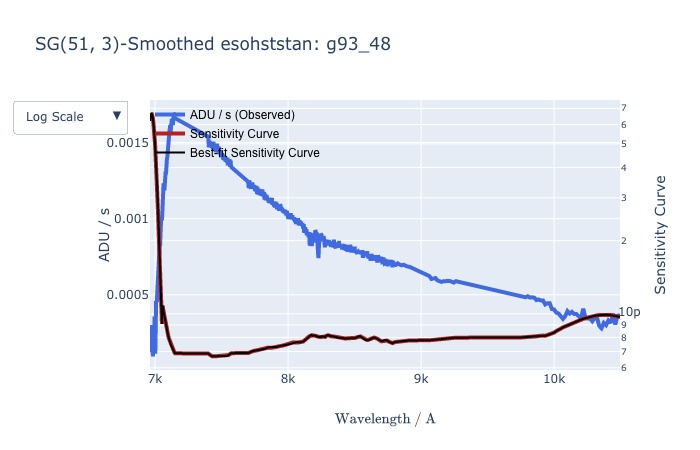

In [9]:
# Get the sensitivity curves
pso_reduced = spectral_reduction.OneDSpec(
    pso,
    wavecal_science,
    standard=g93,
    wave_cal_std=wavecal_standard,
    flux_cal=fluxcal
)
pso_reduced.apply_wavelength_calibration('science+standard')
pso_reduced.compute_sensitivity(kind='cubic', smooth=True, slength=51)
pso_reduced.inspect_sensitivity(renderer='jpg')

In [10]:
pso_reduced.apply_flux_calibration('science+standard')
pso_reduced.inspect_reduced_spectrum('science+standard', wave_min=7000, wave_max=10500, renderer='default')

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:2978: RuntimeWarning:

invalid value encountered in greater

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:2980: RuntimeWarning:

invalid value encountered in less



/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:3096: RuntimeWarning:

invalid value encountered in greater

/Users/marcolam/git/ASPIRED/aspired/spectral_reduction.py:3098: RuntimeWarning:

invalid value encountered in less

